<a href="https://colab.research.google.com/github/AI4Finance-Foundation/FinRL-Meta/blob/master/tutorials/1-Introduction/FinRL_PortfolioAllocation_NeurIPS_2020.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [79]:
import sys

# Option 1:
print(sys.version_info)

# Option 2:
print(sys.version)


sys.version_info(major=3, minor=10, micro=11, releaselevel='final', serial=0)
3.10.11 (main, May 17 2023, 14:30:36) [Clang 14.0.6 ]


# Deep Reinforcement Learning for Stock Trading from Scratch: Portfolio Allocation

Tutorials to use OpenAI DRL to perform portfolio allocation in one Jupyter Notebook | Presented at NeurIPS 2020: Deep RL Workshop

* This blog is based on our paper: FinRL: A Deep Reinforcement Learning Library for Automated Stock Trading in Quantitative Finance, presented at NeurIPS 2020: Deep RL Workshop.
* Check out medium blog for detailed explanations: https://towardsdatascience.com/finrl-for-quantitative-finance-tutorial-for-portfolio-allocation-9b417660c7cd
* Please report any issues to our Github: https://github.com/AI4Finance-Foundation/FinRL/issues
* **Pytorch Version** 



# Content

* [1. Problem Definition](#0)
* [2. Getting Started - Load Python packages](#1)
    * [2.1. Install Packages](#1.1)    
    * [2.2. Check Additional Packages](#1.2)
    * [2.3. Import Packages](#1.3)
    * [2.4. Create Folders](#1.4)
* [3. Download Data](#2)
* [4. Preprocess Data](#3)        
    * [4.1. Technical Indicators](#3.1)
    * [4.2. Perform Feature Engineering](#3.2)
* [5.Build Environment](#4)  
    * [5.1. Training & Trade Data Split](#4.1)
    * [5.2. User-defined Environment](#4.2)   
    * [5.3. Initialize Environment](#4.3)    
* [6.Implement DRL Algorithms](#5)  
* [7.Backtesting Performance](#6)  
    * [7.1. BackTestStats](#6.1)
    * [7.2. BackTestPlot](#6.2)   
    * [7.3. Baseline Stats](#6.3)   
    * [7.3. Compare to Stock Market Index](#6.4)             

<a id='0'></a>
# Part 1. Problem Definition

This problem is to design an automated trading solution for portfolio alloacation. We model the stock trading process as a Markov Decision Process (MDP). We then formulate our trading goal as a maximization problem.

The algorithm is trained using Deep Reinforcement Learning (DRL) algorithms and the components of the reinforcement learning environment are:


* Action: The action space describes the allowed actions that the agent interacts with the
environment. Normally, a ∈ A represents the weight of a stock in the porfolio: a ∈ (-1,1). Assume our stock pool includes N stocks, we can use a list [a<sub>1</sub>, a<sub>2</sub>, ... , a<sub>N</sub>] to determine the weight for each stock in the porfotlio, where a<sub>i</sub> ∈ (-1,1), a<sub>1</sub>+ a<sub>2</sub>+...+a<sub>N</sub>=1. For example, "The weight of AAPL in the portfolio is 10%." is [0.1 , ...].

* Reward function: r(s, a, s′) is the incentive mechanism for an agent to learn a better action. The change of the portfolio value when action a is taken at state s and arriving at new state s',  i.e., r(s, a, s′) = v′ − v, where v′ and v represent the portfolio
values at state s′ and s, respectively

* State: The state space describes the observations that the agent receives from the environment. Just as a human trader needs to analyze various information before executing a trade, so
our trading agent observes many different features to better learn in an interactive environment.

* Environment: Dow 30 consituents


The data of the single stock that we will be using for this case study is obtained from Yahoo Finance API. The data contains Open-High-Low-Close price and volume.


<a id='1'></a>
# Part 2. Getting Started- Load Python Packages

<a id='1.1'></a>
## 2.1. Install all the packages through FinRL library


In [80]:
# ## install finrl library
# %pip install wrds
# %pip install swig
# %pip install git+https://github.com/AI4Finance-Foundation/FinRL.git


<a id='1.2'></a>
## 2.2. Check if the additional packages needed are present, if not install them. 
* Yahoo Finance API
* pandas
* numpy
* matplotlib
* stockstats
* OpenAI gym
* stable-baselines
* tensorflow
* pyfolio

<a id='1.3'></a>
## 2.3. Import Packages

In [81]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
matplotlib.use('Agg')
%matplotlib inline
import datetime
from stockstats import StockDataFrame as Sdf
from finrl import config
from finrl import config_tickers
from finrl.meta.preprocessor.yahoodownloader import YahooDownloader
from finrl.meta.preprocessor.preprocessors import FeatureEngineer, data_split
from finrl.meta.env_portfolio_allocation.env_portfolio import StockPortfolioEnv
from finrl.agents.stablebaselines3.models import DRLAgent
from finrl.plot import backtest_stats, backtest_plot, get_daily_return, get_baseline,convert_daily_return_to_pyfolio_ts
from finrl.meta.data_processor import DataProcessor
from finrl.meta.data_processors.processor_yahoofinance import YahooFinanceProcessor
import sys
sys.path.append("../FinRL-Library")

<a id='1.4'></a>
## 2.4. Create Folders

In [82]:
import os
if not os.path.exists("./" + config.DATA_SAVE_DIR):
    os.makedirs("./" + config.DATA_SAVE_DIR)
if not os.path.exists("./" + config.TRAINED_MODEL_DIR):
    os.makedirs("./" + config.TRAINED_MODEL_DIR)
if not os.path.exists("./" + config.TENSORBOARD_LOG_DIR):
    os.makedirs("./" + config.TENSORBOARD_LOG_DIR)
if not os.path.exists("./" + config.RESULTS_DIR):
    os.makedirs("./" + config.RESULTS_DIR)

<a id='2'></a>
# Part 3. Download Data
Yahoo Finance is a website that provides stock data, financial news, financial reports, etc. All the data provided by Yahoo Finance is free.
* FinRL uses a class **YahooDownloader** to fetch data from Yahoo Finance API
* Call Limit: Using the Public API (without authentication), you are limited to 2,000 requests per hour per IP (or up to a total of 48,000 requests a day).


In [83]:
print(config_tickers.DOW_30_TICKER)

['AXP', 'AMGN', 'AAPL', 'BA', 'CAT', 'CSCO', 'CVX', 'GS', 'HD', 'HON', 'IBM', 'INTC', 'JNJ', 'KO', 'JPM', 'MCD', 'MMM', 'MRK', 'MSFT', 'NKE', 'PG', 'TRV', 'UNH', 'CRM', 'VZ', 'V', 'WBA', 'WMT', 'DIS', 'DOW']


In [84]:
full_start_date="2004-01-01"
full_end_date="2023-07-19"
train_start_date="2004-01-01"
train_end_date="2015-12-31"
validate_start_date="2011-01-01"
validate_end_date="2015-12-31"
test_start_date="2016-01-01"
test_end_date="2023-07-19"
etf_list =["SPY","QQQ","IWM","EEM"]
flo_ticker = ["AAPL","MSFT", "NVDA", "INTC","GOOGL","TSLA","DAL"]

In [85]:
dp = YahooFinanceProcessor()

#OWN VERSION

df = dp.download_data_flo(start_date=full_start_date, end_date=full_end_date, ticker_list=etf_list, time_interval="1D")
# df = dp.download_data(start_date = '2021-10-01',
#                      end_date = '2021-10-31',
#                      ticker_list = config_tickers.DOW_30_TICKER, time_interval='1D')
df

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
       timestamp        open        high         low       close    volume  \
0     2004-01-02  111.739998  112.190002  110.730003  111.230003  38072300   
1     2004-01-05  111.690002  112.519997  111.589996  112.440002  27959800   
2     2004-01-06  112.160004  112.730003  112.000000  112.550003  20472800   
3     2004-01-07  112.389999  113.059998  111.889999  112.930000  30170400   
4     2004-01-08  113.250000  113.410004  112.769997  113.379997  36438400   
...          ...         ...         ...         ...         ...       ...   
19667 2023-07-12   40.430000   40.740002   40.410000   40.709999  61015900   
19668 2023-07-13   40.930000   41.320000   40.910000   41.240002  44062400   
19669 2023-07-14   41.

,timestamp,open,high,low,close,volume,tic
0,2004-01-02,111.739998,112.190002,110.730003,111.230003,38072300,SPY
1,2004-01-05,111.690002,112.519997,111.589996,112.440002,27959800,SPY
2,2004-01-06,112.160004,112.730003,112.000000,112.550003,20472800,SPY
3,2004-01-07,112.389999,113.059998,111.889999,112.930000,30170400,SPY
4,2004-01-08,113.250000,113.410004,112.769997,113.379997,36438400,SPY
...,...,...,...,...,...,...,...
19667,2023-07-12,40.430000,40.740002,40.410000,40.709999,61015900,EEM
19668,2023-07-13,40.930000,41.320000,40.910000,41.240002,44062400,EEM
19669,2023-07-14,41.139999,41.160000,40.980000,41.009998,26724500,EEM
19670,2023-07-17,40.840000,41.070000,40.669998,41.060001,25782900,EEM


In [86]:
df

,timestamp,open,high,low,close,volume,tic
0,2004-01-02,111.739998,112.190002,110.730003,111.230003,38072300,SPY
1,2004-01-05,111.690002,112.519997,111.589996,112.440002,27959800,SPY
2,2004-01-06,112.160004,112.730003,112.000000,112.550003,20472800,SPY
3,2004-01-07,112.389999,113.059998,111.889999,112.930000,30170400,SPY
4,2004-01-08,113.250000,113.410004,112.769997,113.379997,36438400,SPY
...,...,...,...,...,...,...,...
19667,2023-07-12,40.430000,40.740002,40.410000,40.709999,61015900,EEM
19668,2023-07-13,40.930000,41.320000,40.910000,41.240002,44062400,EEM
19669,2023-07-14,41.139999,41.160000,40.980000,41.009998,26724500,EEM
19670,2023-07-17,40.840000,41.070000,40.669998,41.060001,25782900,EEM


In [87]:
df.shape
df = df.rename(columns={"timestamp":"date"})
df

,date,open,high,low,close,volume,tic
0,2004-01-02,111.739998,112.190002,110.730003,111.230003,38072300,SPY
1,2004-01-05,111.690002,112.519997,111.589996,112.440002,27959800,SPY
2,2004-01-06,112.160004,112.730003,112.000000,112.550003,20472800,SPY
3,2004-01-07,112.389999,113.059998,111.889999,112.930000,30170400,SPY
4,2004-01-08,113.250000,113.410004,112.769997,113.379997,36438400,SPY
...,...,...,...,...,...,...,...
19667,2023-07-12,40.430000,40.740002,40.410000,40.709999,61015900,EEM
19668,2023-07-13,40.930000,41.320000,40.910000,41.240002,44062400,EEM
19669,2023-07-14,41.139999,41.160000,40.980000,41.009998,26724500,EEM
19670,2023-07-17,40.840000,41.070000,40.669998,41.060001,25782900,EEM


# Part 4: Preprocess Data
Data preprocessing is a crucial step for training a high quality machine learning model. We need to check for missing data and do feature engineering in order to convert the data into a model-ready state.
* Add technical indicators. In practical trading, various information needs to be taken into account, for example the historical stock prices, current holding shares, technical indicators, etc. In this article, we demonstrate two trend-following technical indicators: MACD and RSI.
* Add turbulence index. Risk-aversion reflects whether an investor will choose to preserve the capital. It also influences one's trading strategy when facing different market volatility level. To control the risk in a worst-case scenario, such as financial crisis of 2007–2008, FinRL employs the financial turbulence index that measures extreme asset price fluctuation.

In [88]:
fe = FeatureEngineer(
                    use_technical_indicator=True,
                    use_turbulence=False,
                    user_defined_feature = True) 

df = fe.preprocess_data(df)
df

Successfully added technical indicators
function triggered
Successfully added user defined features


,date,open,high,low,close,volume,tic,macd,boll_ub,boll_lb,...,trix,vr,wr,cci,atr,supertrend,supertrend_ub,supertrend_lb,dma,pdi
0,2004-01-02,18.344444,18.709999,18.344444,18.620001,1845000,EEM,0.000000,19.870617,18.022716,...,0.000000,100.000000,-24.619631,66.666667,0.365555,19.623886,19.623886,17.430557,0.000000,0.000000
1,2004-01-02,55.584999,56.314999,55.580002,55.994999,11182200,IWM,0.000000,19.870617,18.022716,...,0.000000,100.000000,-43.537563,66.666667,0.734997,58.152491,58.152491,53.742510,0.000000,0.000000
2,2004-01-02,36.660000,36.790001,36.220001,36.360001,55234100,QQQ,0.000000,19.870617,18.022716,...,0.000000,100.000000,-75.438690,66.666667,0.570000,38.215000,38.215000,34.795002,0.000000,0.000000
3,2004-01-02,111.739998,112.190002,110.730003,111.230003,38072300,SPY,0.000000,19.870617,18.022716,...,0.000000,100.000000,-65.753403,66.666667,1.459999,115.840000,115.840000,107.080006,0.000000,0.000000
4,2004-01-05,19.133333,19.273333,19.000000,19.273333,2981700,EEM,0.014658,19.870617,18.022716,...,0.557635,423.219512,-0.000000,66.666667,0.514772,19.623886,19.623886,17.592349,0.000000,58.625085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19667,2023-07-17,449.130005,451.929993,449.079987,450.839996,52680200,SPY,5.510011,451.403676,429.560322,...,0.167699,178.693128,-5.436394,135.093272,3.870503,438.893479,461.011020,438.893479,15.868198,42.782795
19668,2023-07-18,40.830002,40.919998,40.639999,40.759998,29378000,EEM,0.344263,41.283878,38.544122,...,0.089436,137.074406,-22.310827,78.680937,0.484605,39.580604,42.233815,39.580604,0.645600,43.378652
19669,2023-07-18,193.699997,196.389999,193.490005,195.970001,28551500,IWM,3.158477,195.820945,178.250056,...,0.210341,130.278769,-2.680269,135.785805,3.019632,185.881107,200.932388,185.881107,7.657600,40.215489
19670,2023-07-18,381.959991,387.130005,380.000000,385.739990,55343400,QQQ,7.529058,383.835404,354.662594,...,0.251114,156.426538,-5.509370,152.035039,5.175331,368.039009,395.732207,368.039009,20.232596,46.129828


<a id='4'></a>
# Flo - Add own Indicators
TBD

In [89]:
# df

In [90]:
df.shape

(19672, 32)

In [91]:
test = df.date.factorize()[0]
test

array([   0,    0,    0, ..., 4917, 4917, 4917])

In [92]:
df.index = df.date.factorize()[0]
lookrange=252
for i in range(lookrange,len(df.index.unique())):
  data_lookback = df.loc[i-lookrange:i,:]
  print(data_lookback)


          date        open        high         low       close     volume  \
0   2004-01-02   18.344444   18.709999   18.344444   18.620001    1845000   
0   2004-01-02   55.584999   56.314999   55.580002   55.994999   11182200   
0   2004-01-02   36.660000   36.790001   36.220001   36.360001   55234100   
0   2004-01-02  111.739998  112.190002  110.730003  111.230003   38072300   
1   2004-01-05   19.133333   19.273333   19.000000   19.273333    2981700   
..         ...         ...         ...         ...         ...        ...   
251 2004-12-31  121.300003  121.660004  120.800003  120.870003   28648800   
252 2005-01-03   22.411112   22.494444   22.153334   22.194445    4275000   
252 2005-01-03   65.095001   65.209999   63.570000   63.910000   16062600   
252 2005-01-03   40.090000   40.290001   39.369999   39.500000  100970900   
252 2005-01-03  121.559998  121.760002  119.900002  120.300003   55748000   

     tic      macd     boll_ub     boll_lb  ...      trix          vr  \
0 

In [93]:
df
df = df.sort_values(by=["tic", "date"])
df
stock = Sdf.retype(df.copy())
stock
unique_ticker = stock.tic.unique()
unique_ticker

array(['EEM', 'IWM', 'QQQ', 'SPY'], dtype=object)

## Add covariance matrix as states

In [94]:
# add covariance matrix as states
df=df.sort_values(['date','tic'],ignore_index=True)
df.index = df.date.factorize()[0]

cov_list = []
return_list = []

# look back is one year
lookback=252
for i in range(lookback,len(df.index.unique())):
  data_lookback = df.loc[i-lookback:i,:]
  price_lookback=data_lookback.pivot_table(index = 'date',columns = 'tic', values = 'close')
  return_lookback = price_lookback.pct_change().dropna()
  return_list.append(return_lookback)

  covs = return_lookback.cov().values 
  cov_list.append(covs)

  
df_cov = pd.DataFrame({'date':df.date.unique()[lookback:],'cov_list':cov_list,'return_list':return_list})
df = df.merge(df_cov, on='date')
df = df.sort_values(['date','tic']).reset_index(drop=True)
        

In [95]:
# df.to_csv("testcov.csv")

In [96]:
df

,date,open,high,low,close,volume,tic,macd,boll_ub,boll_lb,...,wr,cci,atr,supertrend,supertrend_ub,supertrend_lb,dma,pdi,cov_list,return_list
0,2005-01-03,22.411112,22.494444,22.153334,22.194445,4275000,EEM,0.319758,22.668743,21.046701,...,-27.692270,74.805036,0.234399,21.703095,22.577387,21.703095,1.018711,28.654238,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
1,2005-01-03,65.095001,65.209999,63.570000,63.910000,16062600,IWM,0.689899,65.565332,62.498167,...,-78.021937,-48.945600,0.799687,62.799859,66.789060,62.799859,2.428700,13.756927,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
2,2005-01-03,40.090000,40.290001,39.369999,39.500000,100970900,QQQ,0.230425,40.521572,39.229428,...,-74.213849,-38.661556,0.511679,38.764250,41.117513,38.764250,0.881600,9.078756,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
3,2005-01-03,121.559998,121.760002,119.900002,120.300003,55748000,SPY,0.822064,122.001092,118.358908,...,-56.153844,1.674167,1.002399,118.478075,122.840646,118.478075,2.755800,14.363087,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
4,2005-01-04,22.138889,22.150000,21.511110,21.511110,4205700,EEM,0.249204,22.665146,21.013966,...,-100.000000,-116.745014,0.266466,22.577387,22.577387,21.703095,0.925711,21.845160,"[[0.00015603110252106138, 0.000101467707804756...",tic EEM IWM QQQ ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18659,2023-07-17,449.130005,451.929993,449.079987,450.839996,52680200,SPY,5.510011,451.403676,429.560322,...,-5.436394,135.093272,3.870503,438.893479,461.011020,438.893479,15.868198,42.782795,"[[0.00013955674746505027, 0.000116144247364178...",tic EEM IWM QQQ ...
18660,2023-07-18,40.830002,40.919998,40.639999,40.759998,29378000,EEM,0.344263,41.283878,38.544122,...,-22.310827,78.680937,0.484605,39.580604,42.233815,39.580604,0.645600,43.378652,"[[0.00013969215529474572, 0.000115394451776116...",tic EEM IWM QQQ ...
18661,2023-07-18,193.699997,196.389999,193.490005,195.970001,28551500,IWM,3.158477,195.820945,178.250056,...,-2.680269,135.785805,3.019632,185.881107,200.932388,185.881107,7.657600,40.215489,"[[0.00013969215529474572, 0.000115394451776116...",tic EEM IWM QQQ ...
18662,2023-07-18,381.959991,387.130005,380.000000,385.739990,55343400,QQQ,7.529058,383.835404,354.662594,...,-5.509370,152.035039,5.175331,368.039009,395.732207,368.039009,20.232596,46.129828,"[[0.00013969215529474572, 0.000115394451776116...",tic EEM IWM QQQ ...


<a id='4'></a>
# Part 5. Design Environment
Considering the stochastic and interactive nature of the automated stock trading tasks, a financial task is modeled as a **Markov Decision Process (MDP)** problem. The training process involves observing stock price change, taking an action and reward's calculation to have the agent adjusting its strategy accordingly. By interacting with the environment, the trading agent will derive a trading strategy with the maximized rewards as time proceeds.

Our trading environments, based on OpenAI Gym framework, simulate live stock markets with real market data according to the principle of time-driven simulation.


## Training data split: 2009-01-01 to 2020-07-01

In [97]:
train = data_split(df, train_start_date, train_end_date)
validate = data_split(df, validate_start_date, validate_end_date)
#trade = data_split(df, '2020-01-01', config.END_DATE)

In [98]:
# train.to_csv("train.csv")

In [99]:
train

,date,open,high,low,close,volume,tic,macd,boll_ub,boll_lb,...,wr,cci,atr,supertrend,supertrend_ub,supertrend_lb,dma,pdi,cov_list,return_list
0,2005-01-03,22.411112,22.494444,22.153334,22.194445,4275000,EEM,0.319758,22.668743,21.046701,...,-27.692270,74.805036,0.234399,21.703095,22.577387,21.703095,1.018711,28.654238,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
0,2005-01-03,65.095001,65.209999,63.570000,63.910000,16062600,IWM,0.689899,65.565332,62.498167,...,-78.021937,-48.945600,0.799687,62.799859,66.789060,62.799859,2.428700,13.756927,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
0,2005-01-03,40.090000,40.290001,39.369999,39.500000,100970900,QQQ,0.230425,40.521572,39.229428,...,-74.213849,-38.661556,0.511679,38.764250,41.117513,38.764250,0.881600,9.078756,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
0,2005-01-03,121.559998,121.760002,119.900002,120.300003,55748000,SPY,0.822064,122.001092,118.358908,...,-56.153844,1.674167,1.002399,118.478075,122.840646,118.478075,2.755800,14.363087,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
1,2005-01-04,22.138889,22.150000,21.511110,21.511110,4205700,EEM,0.249204,22.665146,21.013966,...,-100.000000,-116.745014,0.266466,22.577387,22.577387,21.703095,0.925711,21.845160,"[[0.00015603110252106138, 0.000101467707804756...",tic EEM IWM QQQ ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2766,2015-12-29,206.509995,207.789993,206.470001,207.399994,92640700,SPY,-0.395150,211.134398,200.180600,...,-14.463278,98.323900,2.637459,209.527328,209.527328,199.217620,-2.076599,36.258063,"[[0.00017783492654532737, 9.719349499492343e-0...",tic EEM IWM QQQ ...
2767,2015-12-30,32.480000,32.529999,32.270000,32.290001,51320000,EEM,-0.388890,33.981424,31.676576,...,-57.526846,-47.228555,0.473206,33.329962,33.329962,31.481412,-1.331600,26.602699,"[[0.00017869021918166927, 9.784353451233212e-0...",tic EEM IWM QQQ ...
2767,2015-12-30,115.050003,115.349998,114.000000,114.040001,21273200,IWM,-0.564282,118.234146,110.356854,...,-25.838218,70.846679,1.660979,116.846495,116.846495,109.692063,-2.061000,26.478634,"[[0.00017869021918166927, 9.784353451233212e-0...",tic EEM IWM QQQ ...
2767,2015-12-30,114.199997,114.239998,113.250000,113.269997,19520100,QQQ,0.042681,115.664072,109.998928,...,-24.758317,89.222410,1.524800,115.600705,115.600705,109.170600,-0.544399,31.791444,"[[0.00017869021918166927, 9.784353451233212e-0...",tic EEM IWM QQQ ...


## Environment for Portfolio Allocation


In [100]:
import numpy as np
import pandas as pd
from gym.utils import seeding
import gym
from gym import spaces
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
from stable_baselines3.common.vec_env import DummyVecEnv


class StockPortfolioEnv(gym.Env):
    """A single stock trading environment for OpenAI gym

    Attributes
    ----------
        df: DataFrame
            input data
        stock_dim : int
            number of unique stocks
        hmax : int
            maximum number of shares to trade
        initial_amount : int
            start money
        transaction_cost_pct: float
            transaction cost percentage per trade
        reward_scaling: float
            scaling factor for reward, good for training
        state_space: int
            the dimension of input features
        action_space: int
            equals stock dimension
        tech_indicator_list: list
            a list of technical indicator names
        turbulence_threshold: int
            a threshold to control risk aversion
        day: int
            an increment number to control date

    Methods
    -------
    _sell_stock()
        perform sell action based on the sign of the action
    _buy_stock()
        perform buy action based on the sign of the action
    step()
        at each step the agent will return actions, then 
        we will calculate the reward, and return the next observation.
    reset()
        reset the environment
    render()
        use render to return other functions
    save_asset_memory()
        return account value at each time step
    save_action_memory()
        return actions/positions at each time step
        

    """
    metadata = {'render.modes': ['human']}

    def __init__(self, 
                df,
                stock_dim,
                hmax,
                initial_amount,
                transaction_cost_pct,
                reward_scaling,
                state_space,
                action_space,
                tech_indicator_list,
                turbulence_threshold=None,
                lookback=252,
                day = 0):
        #super(StockEnv, self).__init__()
        #money = 10 , scope = 1
        self.day = day
        self.lookback=lookback
        self.df = df
        self.stock_dim = stock_dim
        self.hmax = hmax
        self.initial_amount = initial_amount
        self.transaction_cost_pct =transaction_cost_pct
        self.reward_scaling = reward_scaling
        self.state_space = state_space
        self.action_space = action_space
        self.tech_indicator_list = tech_indicator_list

        # action_space normalization and shape is self.stock_dim
        self.action_space = spaces.Box(low = 0, high = 1,shape = (self.action_space,)) 
        # Shape = (34, 30)
        # covariance matrix + technical indicators
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape = (self.state_space+len(self.tech_indicator_list),self.state_space))

        # load data from a pandas dataframe
        self.data = self.df.loc[self.day,:]
        self.covs = self.data['cov_list'].values[0]
        self.state =  np.append(np.array(self.covs), [self.data[tech].values.tolist() for tech in self.tech_indicator_list ], axis=0)   
        self.terminal = False       
        self.turbulence_threshold = turbulence_threshold        
        # initalize state: inital portfolio return + individual stock return + individual weights
        self.portfolio_value = self.initial_amount

        # memorize portfolio value each step
        self.asset_memory = [self.initial_amount]
        # memorize portfolio return each step
        self.portfolio_return_memory = [0]
        self.actions_memory=[[1/self.stock_dim]*self.stock_dim]
        self.date_memory=[self.data.date.unique()[0]]

        
    def step(self, actions):
        # print(self.day)
        self.terminal = self.day >= len(self.df.index.unique())-1
        # print(actions)

        if self.terminal:
            df = pd.DataFrame(self.portfolio_return_memory)
            df.columns = ['daily_return']
            plt.plot(df.daily_return.cumsum(),'r')
            plt.savefig('results/cumulative_reward.png')
            plt.close()
            
            plt.plot(self.portfolio_return_memory,'r')
            plt.savefig('results/rewards.png')
            plt.close()

            print("=================================")
            print("begin_total_asset:{}".format(self.asset_memory[0]))           
            print("end_total_asset:{}".format(self.portfolio_value))

            df_daily_return = pd.DataFrame(self.portfolio_return_memory)
            df_daily_return.columns = ['daily_return']
            if df_daily_return['daily_return'].std() !=0:
              sharpe = (252**0.5)*df_daily_return['daily_return'].mean()/ \
                       df_daily_return['daily_return'].std()
              print("Sharpe: ",sharpe)
            print("=================================")
            
            return self.state, self.reward, self.terminal,{}

        else:
            #print("Model actions: ",actions)
            # actions are the portfolio weight
            # normalize to sum of 1
            #if (np.array(actions) - np.array(actions).min()).sum() != 0:
            #  norm_actions = (np.array(actions) - np.array(actions).min()) / (np.array(actions) - np.array(actions).min()).sum()
            #else:
            #  norm_actions = actions
            weights = self.softmax_normalization(actions) 
            #print("Normalized actions: ", weights)
            self.actions_memory.append(weights)
            last_day_memory = self.data

            #load next state
            self.day += 1
            self.data = self.df.loc[self.day,:]
            self.covs = self.data['cov_list'].values[0]
            self.state =  np.append(np.array(self.covs), [self.data[tech].values.tolist() for tech in self.tech_indicator_list ], axis=0)
            #print(self.state)
            # calcualte portfolio return
            # individual stocks' return * weight
            portfolio_return = sum(((self.data.close.values / last_day_memory.close.values)-1)*weights)
            # update portfolio value
            new_portfolio_value = self.portfolio_value*(1+portfolio_return)
            self.portfolio_value = new_portfolio_value

            # save into memory
            self.portfolio_return_memory.append(portfolio_return)
            self.date_memory.append(self.data.date.unique()[0])            
            self.asset_memory.append(new_portfolio_value)

            # the reward is the new portfolio value or end portfolo value
            self.reward = new_portfolio_value 
            #print("Step reward: ", self.reward)
            #self.reward = self.reward*self.reward_scaling

        return self.state, self.reward, self.terminal, {}

    def reset(self):
        self.asset_memory = [self.initial_amount]
        self.day = 0
        self.data = self.df.loc[self.day,:]
        # load states
        self.covs = self.data['cov_list'].values[0]
        self.state =  np.append(np.array(self.covs), [self.data[tech].values.tolist() for tech in self.tech_indicator_list ], axis=0)
        self.portfolio_value = self.initial_amount
        #self.cost = 0
        #self.trades = 0
        self.terminal = False 
        self.portfolio_return_memory = [0]
        self.actions_memory=[[1/self.stock_dim]*self.stock_dim]
        self.date_memory=[self.data.date.unique()[0]] 
        return self.state
    
    def render(self, mode='human'):
        return self.state
        
    def softmax_normalization(self, actions):
        numerator = np.exp(actions)
        denominator = np.sum(np.exp(actions))
        softmax_output = numerator/denominator
        return softmax_output

    
    def save_asset_memory(self):
        date_list = self.date_memory
        portfolio_return = self.portfolio_return_memory
        #print(len(date_list))
        #print(len(asset_list))
        df_account_value = pd.DataFrame({'date':date_list,'daily_return':portfolio_return})
        return df_account_value

    def save_action_memory(self):
        # date and close price length must match actions length
        date_list = self.date_memory
        df_date = pd.DataFrame(date_list)
        df_date.columns = ['date']
        
        action_list = self.actions_memory
        df_actions = pd.DataFrame(action_list)
        df_actions.columns = self.data.tic.values
        df_actions.index = df_date.date
        #df_actions = pd.DataFrame({'date':date_list,'actions':action_list})
        return df_actions

    def _seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def get_sb_env(self):
        e = DummyVecEnv([lambda: self])
        obs = e.reset()
        return e, obs

In [101]:
stock_dimension = len(train.tic.unique())
state_space = stock_dimension
print(f"Stock Dimension: {stock_dimension}, State Space: {state_space}")


Stock Dimension: 4, State Space: 4


In [102]:
env_kwargs = {
    "hmax": 100, 
    "initial_amount": 1000000, 
    "transaction_cost_pct": 0.001, 
    "state_space": state_space, 
    "stock_dim": stock_dimension, 
    "tech_indicator_list": config.INDICATORS, 
    "action_space": stock_dimension, 
    "reward_scaling": 1e-4
    
}

e_train_gym = StockPortfolioEnv(df = train, **env_kwargs)
#!FLO New validation set
e_validate_gym = StockPortfolioEnv(df = validate, **env_kwargs)

In [103]:
env_train, _ = e_train_gym.get_sb_env()
#!FLO New validation set
env_validate, _ = e_validate_gym.get_sb_env()
print(type(env_train))

<class 'stable_baselines3.common.vec_env.dummy_vec_env.DummyVecEnv'>


/Users/floriankockler/anaconda3/envs/py310/lib/python3.10/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning:

You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.



HYPEROPT

<a id='5'></a>
# Part 6: Implement DRL Algorithms
* The implementation of the DRL algorithms are based on **OpenAI Baselines** and **Stable Baselines**. Stable Baselines is a fork of OpenAI Baselines, with a major structural refactoring, and code cleanups.
* FinRL library includes fine-tuned standard DRL algorithms, such as DQN, DDPG,
Multi-Agent DDPG, PPO, SAC, A2C and TD3. We also allow users to
design their own DRL algorithms by adapting these DRL algorithms.

In [104]:
# initialize
agent = DRLAgent(env = env_train)


### Model 1: **A2C**


In [105]:
agent = DRLAgent(env = env_train)

A2C_PARAMS = {"n_steps": 5, "ent_coef": 0.005, "learning_rate": 0.0002}
model_a2c = agent.get_model(model_name="a2c",model_kwargs = A2C_PARAMS, tensorboard_log='/Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/')

{'n_steps': 5, 'ent_coef': 0.005, 'learning_rate': 0.0002}
Using cpu device


In [106]:
trained_a2c = agent.train_model(model=model_a2c, 
                                tb_log_name='a2c_etf',
                                total_timesteps=50000)

    

Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_7
-------------------------------------
| time/                 |           |
|    fps                | 1239      |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 500       |
| train/                |           |
|    entropy_loss       | -5.66     |
|    explained_variance | 0         |
|    learning_rate      | 0.0002    |
|    n_updates          | 99        |
|    policy_loss        | 2.29e+07  |
|    reward             | 1268398.6 |
|    std                | 0.997     |
|    value_loss         | 1.7e+13   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1454      |
|    iterations         | 200       |
|    time_elapsed       | 0         |
|    total_timesteps    | 1000      |
| train/                |           |
|    entropy_loss       | -5.

In [107]:
trained_a2c.save('/Users/floriankockler/Documents/GitHub.nosync/TrainedModels//trained_a2c_etf_new2.zip')

### Model 2: **PPO**


In [108]:
# agent = DRLAgent(env = env_train)
# PPO_PARAMS = {
#     "n_steps": 2048,
#     "ent_coef": 0.005,
#     "learning_rate": 0.0001,
#     "batch_size": 128,
# }
# model_ppo = agent.get_model("ppo",model_kwargs = PPO_PARAMS)

In [109]:
# trained_ppo = agent.train_model(model=model_ppo, 
#                              tb_log_name='ppo',
#                              total_timesteps=80000)

In [110]:
# trained_ppo.save('/Users/floriankockler/Documents/GitHub.nosynctrained_ppo_etf_us.zip')

### Model 3: **DDPG**


In [111]:
# agent = DRLAgent(env = env_train)
# DDPG_PARAMS = {"batch_size": 128, "buffer_size": 50000, "learning_rate": 0.001}


# model_ddpg = agent.get_model("ddpg",model_kwargs = DDPG_PARAMS)

In [112]:
# trained_ddpg = agent.train_model(model=model_ddpg, 
#                              tb_log_name='ddpg',
#                              total_timesteps=50000)

In [113]:
# trained_ddpg.save('/content/trained_models/trained_ddpg.zip')

### Model 4: **SAC**


In [114]:
# agent = DRLAgent(env = env_train)
# SAC_PARAMS = {
#     "batch_size": 128,
#     "buffer_size": 100000,
#     "learning_rate": 0.0003,
#     "learning_starts": 100,
#     "ent_coef": "auto_0.1",
# }

# model_sac = agent.get_model("sac",model_kwargs = SAC_PARAMS)

In [115]:
# trained_sac = agent.train_model(model=model_sac, 
#                              tb_log_name='sac',
#                              total_timesteps=50000)

In [116]:
# trained_sac.save('/content/trained_models/trained_sac.zip')

### Model 5: **TD3**


In [117]:
# agent = DRLAgent(env = env_train)
# TD3_PARAMS = {"batch_size": 100, 
#               "buffer_size": 1000000, 
#               "learning_rate": 0.001}

# model_td3 = agent.get_model("td3",model_kwargs = TD3_PARAMS)

In [118]:
# trained_td3 = agent.train_model(model=model_td3, 
#                              tb_log_name='td3',
#                              total_timesteps=30000)

In [119]:
# trained_td3.save('/content/trained_models/trained_td3.zip')

HYPEROPT

## Trading
Assume that we have $1,000,000 initial capital at 2019-01-01. We use the A2C model to trade Dow jones 30 stocks.

In [120]:
trade = data_split(df,test_start_date, test_end_date)
e_trade_gym = StockPortfolioEnv(df = trade, **env_kwargs)



In [121]:
trade.shape
trade

,date,open,high,low,close,volume,tic,macd,boll_ub,boll_lb,...,wr,cci,atr,supertrend,supertrend_ub,supertrend_lb,dma,pdi,cov_list,return_list
0,2016-01-04,31.350000,31.379999,31.049999,31.309999,83489100,EEM,-0.484870,33.802162,31.456838,...,-88.744586,-235.523452,0.505366,32.731099,32.731099,31.481412,-1.422200,18.710008,"[[0.00018090239065547364, 0.000100151953521720...",tic EEM IWM QQQ ...
0,2016-01-04,110.610001,110.830002,109.080002,110.010002,66665900,IWM,-0.903183,117.312317,110.021684,...,-85.167451,-181.386239,1.786507,115.314524,115.314524,109.692063,-2.430600,18.490944,"[[0.00018090239065547364, 0.000100151953521720...",tic EEM IWM QQQ ...
0,2016-01-04,109.449997,109.599998,108.120003,109.500000,50807600,QQQ,-0.277750,115.658817,109.444182,...,-78.538146,-185.215107,1.676740,113.890222,113.890222,109.170600,-1.151600,21.715079,"[[0.00018090239065547364, 0.000100151953521720...",tic EEM IWM QQQ ...
0,2016-01-04,200.490005,201.029999,198.589996,201.020004,222353500,SPY,-0.706034,210.066415,199.848583,...,-75.429645,-135.097625,2.726478,207.989433,207.989433,199.217620,-2.836400,22.832031,"[[0.00018090239065547364, 0.000100151953521720...",tic EEM IWM QQQ ...
1,2016-01-05,31.450001,31.500000,31.299999,31.379999,57773900,EEM,-0.535600,33.648537,31.360463,...,-85.714298,-178.896558,0.483555,32.731099,32.731099,29.949336,-1.455200,20.255623,"[[0.0001797749651999717, 9.928566980655597e-05...",tic EEM IWM QQQ ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1895,2023-07-17,449.130005,451.929993,449.079987,450.839996,52680200,SPY,5.510011,451.403676,429.560322,...,-5.436394,135.093272,3.870503,438.893479,461.011020,438.893479,15.868198,42.782795,"[[0.00013955674746505027, 0.000116144247364178...",tic EEM IWM QQQ ...
1896,2023-07-18,40.830002,40.919998,40.639999,40.759998,29378000,EEM,0.344263,41.283878,38.544122,...,-22.310827,78.680937,0.484605,39.580604,42.233815,39.580604,0.645600,43.378652,"[[0.00013969215529474572, 0.000115394451776116...",tic EEM IWM QQQ ...
1896,2023-07-18,193.699997,196.389999,193.490005,195.970001,28551500,IWM,3.158477,195.820945,178.250056,...,-2.680269,135.785805,3.019632,185.881107,200.932388,185.881107,7.657600,40.215489,"[[0.00013969215529474572, 0.000115394451776116...",tic EEM IWM QQQ ...
1896,2023-07-18,381.959991,387.130005,380.000000,385.739990,55343400,QQQ,7.529058,383.835404,354.662594,...,-5.509370,152.035039,5.175331,368.039009,395.732207,368.039009,20.232596,46.129828,"[[0.00013969215529474572, 0.000115394451776116...",tic EEM IWM QQQ ...


In [122]:
# df_daily_return, df_actions = DRLAgent.DRL_prediction(model=trained_a2c,
#                         environment = e_trade_gym)

#my own
df_daily_return, df_actions = DRLAgent.DRL_prediction(model=trained_a2c,
                        environment = e_trade_gym)


/Users/floriankockler/anaconda3/envs/py310/lib/python3.10/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning:

You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.



begin_total_asset:1000000
end_total_asset:2356402.2763509923
Sharpe:  0.6621809033340098
hit end!


In [123]:
df_daily_return.head()

,date,daily_return
0,2016-01-04,0.000000
1,2016-01-05,0.000536
2,2016-01-06,-0.013247
3,2016-01-07,-0.028835
4,2016-01-08,-0.011107


In [124]:
df_daily_return.to_csv('df_daily_return.csv')

In [150]:
df_actions.head()

,EEM,IWM,QQQ,SPY
date,,,,
2016-01-04,0.250000,0.250000,0.250000,0.250000
2016-01-05,0.200768,0.200768,0.397697,0.200768
2016-01-06,0.200565,0.200565,0.398306,0.200565
2016-01-07,0.200324,0.200324,0.399028,0.200324
2016-01-08,0.202897,0.202897,0.391308,0.202897


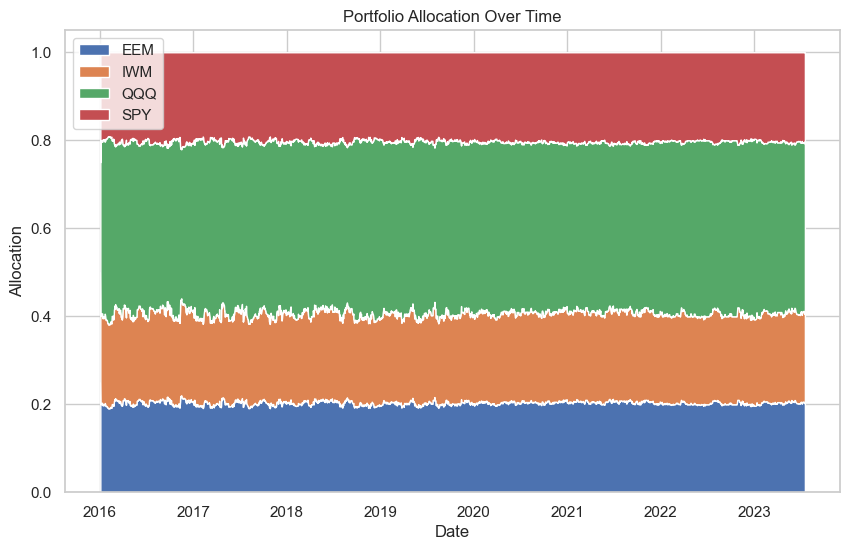

In [154]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))

# assuming actions_df is your DataFrame
ax.stackplot(df_actions.index, df_actions.T, labels=df_actions.columns)

ax.set_title('Portfolio Allocation Over Time')
ax.set_xlabel('Date')
ax.set_ylabel('Allocation')
ax.legend(loc='upper left')

plt.show()

In [126]:
df_actions.to_csv('df_actions.csv')

<a id='6'></a>
# Part 7: Backtest Our Strategy
Backtesting plays a key role in evaluating the performance of a trading strategy. Automated backtesting tool is preferred because it reduces the human error. We usually use the Quantopian pyfolio package to backtest our trading strategies. It is easy to use and consists of various individual plots that provide a comprehensive image of the performance of a trading strategy.

<a id='6.1'></a>
## 7.1 BackTestStats
pass in df_account_value, this information is stored in env class


In [127]:
from pyfolio import timeseries
DRL_strat = convert_daily_return_to_pyfolio_ts(df_daily_return)
perf_func = timeseries.perf_stats 
perf_stats_all = perf_func( returns=DRL_strat, 
                              factor_returns=DRL_strat, 
                                positions=None, transactions=None, turnover_denom="AGB")

In [128]:
# df_daily_return["date"] = pd.to_datetime(df_daily_return["date"])
df_daily_return

,date,daily_return
0,2016-01-04,0.000000
1,2016-01-05,0.000536
2,2016-01-06,-0.013247
3,2016-01-07,-0.028835
4,2016-01-08,-0.011107
...,...,...
1892,2023-07-12,0.013333
1893,2023-07-13,0.012486
1894,2023-07-14,-0.003345
1895,2023-07-17,0.006782


In [129]:
print("==============DRL Strategy Stats===========")
perf_stats_all

==============DRL Strategy Stats===========


Annual return           0.120599
Cumulative returns      1.356402
Annual volatility       0.203413
Sharpe ratio            0.662181
Calmar ratio            0.372023
Stability               0.830152
Max drawdown           -0.324170
Omega ratio             1.131317
Sortino ratio           0.915559
Skew                   -0.672459
Kurtosis               10.093375
Tail ratio              0.918642
Daily value at risk    -0.025093
Alpha                   0.000000
Beta                    1.000000
dtype: float64

In [149]:
#baseline stats
print("==============Get Baseline Stats===========")
baseline_df = get_baseline(
        ticker="QQQ", 
        start = df_daily_return.loc[0,'date'],
        end = df_daily_return.loc[len(df_daily_return)-1,'date'])

stats = backtest_stats(baseline_df, value_col_name = 'close')

==============Get Baseline Stats===========
[*********************100%***********************]  1 of 1 completed
Shape of DataFrame:  (1896, 8)
Annual return          0.189971
Cumulative returns     2.701015
Annual volatility      0.230284
Sharpe ratio           0.871475
Calmar ratio           0.540939
Stability              0.901267
Max drawdown          -0.351187
Omega ratio            1.174244
Sortino ratio          1.227470
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.897223
Daily value at risk   -0.028217
dtype: float64


<a id='6.2'></a>
## 7.2 BackTestPlot

[*********************100%***********************]  1 of 1 completed
Shape of DataFrame:  (1897, 8)


Start date,2016-01-04
End date,2023-07-18
Total months,90
,Backtest
Annual return,12.06%
Cumulative returns,135.64%
Annual volatility,20.341%
Sharpe ratio,0.66
Calmar ratio,0.37
Stability,0.83
Max drawdown,-32.417%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,32.42,2020-02-19,2020-03-23,2020-07-15,106
1,31.38,2021-11-08,2022-10-14,NaT,NaN
2,21.37,2018-08-29,2018-12-24,2019-07-24,236
3,10.99,2016-01-05,2016-02-11,2016-03-16,52
4,10.34,2018-01-26,2018-02-08,2018-07-25,129


/Users/floriankockler/anaconda3/envs/py310/lib/python3.10/site-packages/pyfolio/tears.py:906: UserWarning:

Passed returns do not overlap with anyinteresting times.



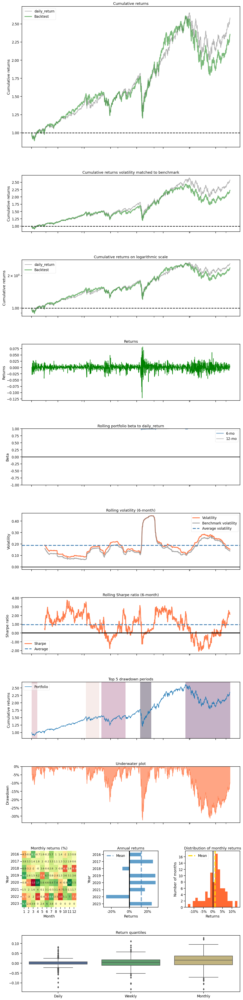

In [148]:
import pyfolio
%matplotlib inline

baseline_df = get_baseline(
        ticker='SPY', start=df_daily_return.loc[0,'date'], end=test_end_date
    )

baseline_returns = get_daily_return(baseline_df, value_col_name="close")

with pyfolio.plotting.plotting_context(font_scale=1.1):
        pyfolio.create_full_tear_sheet(returns = DRL_strat,
        
                                       benchmark_rets=baseline_returns, set_context=False)



## Min-Variance Portfolio Allocation

In [132]:
# %pip install PyPortfolioOpt

In [133]:
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models

In [134]:
unique_tic = trade.tic.unique()
unique_trade_date = trade.date.unique()

In [135]:
unique_trade_date

<DatetimeArray>
['2016-01-04 00:00:00', '2016-01-05 00:00:00', '2016-01-06 00:00:00',
 '2016-01-07 00:00:00', '2016-01-08 00:00:00', '2016-01-11 00:00:00',
 '2016-01-12 00:00:00', '2016-01-13 00:00:00', '2016-01-14 00:00:00',
 '2016-01-15 00:00:00',
 ...
 '2023-07-05 00:00:00', '2023-07-06 00:00:00', '2023-07-07 00:00:00',
 '2023-07-10 00:00:00', '2023-07-11 00:00:00', '2023-07-12 00:00:00',
 '2023-07-13 00:00:00', '2023-07-14 00:00:00', '2023-07-17 00:00:00',
 '2023-07-18 00:00:00']
Length: 1897, dtype: datetime64[ns]

In [136]:
df.head()

,date,open,high,low,close,volume,tic,macd,boll_ub,boll_lb,...,wr,cci,atr,supertrend,supertrend_ub,supertrend_lb,dma,pdi,cov_list,return_list
0,2005-01-03,22.411112,22.494444,22.153334,22.194445,4275000,EEM,0.319758,22.668743,21.046701,...,-27.692270,74.805036,0.234399,21.703095,22.577387,21.703095,1.018711,28.654238,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
1,2005-01-03,65.095001,65.209999,63.570000,63.910000,16062600,IWM,0.689899,65.565332,62.498167,...,-78.021937,-48.945600,0.799687,62.799859,66.789060,62.799859,2.428700,13.756927,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
2,2005-01-03,40.090000,40.290001,39.369999,39.500000,100970900,QQQ,0.230425,40.521572,39.229428,...,-74.213849,-38.661556,0.511679,38.764250,41.117513,38.764250,0.881600,9.078756,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
3,2005-01-03,121.559998,121.760002,119.900002,120.300003,55748000,SPY,0.822064,122.001092,118.358908,...,-56.153844,1.674167,1.002399,118.478075,122.840646,118.478075,2.755800,14.363087,"[[0.00015682101688998303, 0.000100251279558665...",tic EEM IWM QQQ ...
4,2005-01-04,22.138889,22.150000,21.511110,21.511110,4205700,EEM,0.249204,22.665146,21.013966,...,-100.000000,-116.745014,0.266466,22.577387,22.577387,21.703095,0.925711,21.845160,"[[0.00015603110252106138, 0.000101467707804756...",tic EEM IWM QQQ ...


In [137]:
#calculate_portfolio_minimum_variance
portfolio = pd.DataFrame(index = range(1), columns = unique_trade_date)
initial_capital = 1000000
portfolio.loc[0,unique_trade_date[0]] = initial_capital

for i in range(len( unique_trade_date)-1):
    df_temp = df[df.date==unique_trade_date[i]].reset_index(drop=True)
    df_temp_next = df[df.date==unique_trade_date[i+1]].reset_index(drop=True)
    #Sigma = risk_models.sample_cov(df_temp.return_list[0])
    #calculate covariance matrix
    Sigma = df_temp.return_list[0].cov()
    #portfolio allocation
    ef_min_var = EfficientFrontier(None, Sigma,weight_bounds=(0, 0.6))
    #minimum variance
    raw_weights_min_var = ef_min_var.min_volatility()
    #get weights
    cleaned_weights_min_var = ef_min_var.clean_weights()
    
    #current capital
    cap = portfolio.iloc[0, i]
    #current cash invested for each stock
    current_cash = [element * cap for element in list(cleaned_weights_min_var.values())]
    # current held shares
    current_shares = list(np.array(current_cash)
                                      / np.array(df_temp.close))
    # next time period price
    next_price = np.array(df_temp_next.close)
    ##next_price * current share to calculate next total account value 
    portfolio.iloc[0, i+1] = np.dot(current_shares, next_price)
    
portfolio=portfolio.T
portfolio.columns = ['account_value']

In [138]:
portfolio.head()

,account_value
2016-01-04,1000000
2016-01-05,1001876.985692
2016-01-06,988186.739024
2016-01-07,963402.531637
2016-01-08,950354.426819


In [139]:
a2c_cumpod =(df_daily_return.daily_return+1).cumprod()-1

In [140]:
min_var_cumpod =(portfolio.account_value.pct_change()+1).cumprod()-1

In [141]:
dji_cumpod =(baseline_returns+1).cumprod()-1

## Plotly: DRL, Min-Variance, DJIA

In [142]:
# %pip install plotly

In [143]:
from datetime import datetime as dt

import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go

In [144]:
time_ind = pd.Series(df_daily_return.date)

In [145]:
trace0_portfolio = go.Scatter(x = time_ind, y = a2c_cumpod, mode = 'lines', name = 'Model Portfolio')

trace1_portfolio = go.Scatter(x = time_ind, y = dji_cumpod, mode = 'lines', name = 'DJIA')
trace2_portfolio = go.Scatter(x = time_ind, y = min_var_cumpod, mode = 'lines', name = 'Min-Variance')
#trace3_portfolio = go.Scatter(x = time_ind, y = ddpg_cumpod, mode = 'lines', name = 'DDPG')
#trace4_portfolio = go.Scatter(x = time_ind, y = addpg_cumpod, mode = 'lines', name = 'Adaptive-DDPG')
#trace5_portfolio = go.Scatter(x = time_ind, y = min_cumpod, mode = 'lines', name = 'Min-Variance')

#trace4 = go.Scatter(x = time_ind, y = addpg_cumpod, mode = 'lines', name = 'Adaptive-DDPG')

#trace2 = go.Scatter(x = time_ind, y = portfolio_cost_minv, mode = 'lines', name = 'Min-Variance')
#trace3 = go.Scatter(x = time_ind, y = spx_value, mode = 'lines', name = 'SPX')

In [146]:
fig = go.Figure()
fig.add_trace(trace0_portfolio)

fig.add_trace(trace1_portfolio)

fig.add_trace(trace2_portfolio)



fig.update_layout(
    legend=dict(
        x=0,
        y=1,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=15,
            color="black"
        ),
        bgcolor="White",
        bordercolor="white",
        borderwidth=2
        
    ),
)
#fig.update_layout(legend_orientation="h")
fig.update_layout(title={
        #'text': "Cumulative Return using FinRL",
        'y':0.85,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
#with Transaction cost
#fig.update_layout(title =  'Quarterly Trade Date')
fig.update_layout(
#    margin=dict(l=20, r=20, t=20, b=20),

    paper_bgcolor='rgba(1,1,0,0)',
    plot_bgcolor='rgba(1, 1, 0, 0)',
    #xaxis_title="Date",
    yaxis_title="Cumulative Return",
xaxis={'type': 'date', 
       'tick0': time_ind[0], 
        'tickmode': 'linear', 
       'dtick': 86400000.0 *80}

)
fig.update_xaxes(showline=True,linecolor='black',showgrid=True, gridwidth=1, gridcolor='LightSteelBlue',mirror=True)
fig.update_yaxes(showline=True,linecolor='black',showgrid=True, gridwidth=1, gridcolor='LightSteelBlue',mirror=True)
fig.update_yaxes(zeroline=True, zerolinewidth=1, zerolinecolor='LightSteelBlue')

fig.show()

OPTUNA

In [156]:
import optuna
from stable_baselines3 import A2C
from stable_baselines3.common.evaluation import evaluate_policy

def objective(trial):
    # Define a search space for hyperparameters
    learning_rate = trial.suggest_float("learning_rate", 1e-4, 1e-2, log=True)
    n_steps = trial.suggest_int("n_steps", 1, 10)
    ent_coef = trial.suggest_float("ent_coef", 0.001, 0.1, log=True)
    
    # Create the A2C model
    model_kwargs = {"n_steps": n_steps, "ent_coef": ent_coef, "learning_rate": learning_rate}
    model = agent.get_model(model_name="a2c", model_kwargs=model_kwargs, tensorboard_log='/Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs')

    # Train the model
    model = agent.train_model(model=model, tb_log_name='a2c_etf', total_timesteps=50000)

    # Evaluate the model and get the average reward over 100 steps
    mean_reward, _ = evaluate_policy(model, env_train, n_eval_episodes=100)
    
    return mean_reward  # Optuna maximizes the returned value

# Create a study object and optimize the objective function
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)

# Get the best parameters
print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2023-07-20 22:37:42,998] A new study created in memory with name: no-name-235fb121-aa8e-4697-a4e0-2300b73ad72c


{'n_steps': 10, 'ent_coef': 0.019360175955312232, 'learning_rate': 0.0015453229477706899}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_9


-------------------------------------
| time/                 |           |
|    fps                | 1693      |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 1000      |
| train/                |           |
|    entropy_loss       | -5.56     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.00155   |
|    n_updates          | 99        |
|    policy_loss        | 2.3e+07   |
|    reward             | 803628.94 |
|    std                | 0.972     |
|    value_loss         | 2.18e+13  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 1764      |
|    iterations         | 200       |
|    time_elapsed       | 1         |
|    total_timesteps    | 2000      |
| train/                |           |
|    entropy_loss       | -5.56     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.00155   |
|    n_updat

/Users/floriankockler/anaconda3/envs/py310/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:67: UserWarning:

Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.



begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
begin_total_asset:100

[I 2023-07-20 22:40:24,334] Trial 0 finished with value: 3925921621.25 and parameters: {'learning_rate': 0.0015453229477706899, 'n_steps': 10, 'ent_coef': 0.019360175955312232}. Best is trial 0 with value: 3925921621.25.


begin_total_asset:1000000
end_total_asset:2136379.4840123276
Sharpe:  0.4175044313950038
{'n_steps': 3, 'ent_coef': 0.038190517883364306, 'learning_rate': 0.0006484559669656316}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_10
-------------------------------------
| time/                 |           |
|    fps                | 986       |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 300       |
| train/                |           |
|    entropy_loss       | -5.6      |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.000648  |
|    n_updates          | 99        |
|    policy_loss        | 1.42e+07  |
|    reward             | 1168642.2 |
|    std                | 0.983     |
|    value_loss         | 5.94e+12  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps               

[I 2023-07-20 22:43:41,627] Trial 1 finished with value: 3971854189.1875 and parameters: {'learning_rate': 0.0006484559669656316, 'n_steps': 3, 'ent_coef': 0.038190517883364306}. Best is trial 1 with value: 3971854189.1875.


begin_total_asset:1000000
end_total_asset:1983748.4534705456
Sharpe:  0.383394338848646
{'n_steps': 1, 'ent_coef': 0.06083302155636156, 'learning_rate': 0.0003813446952646014}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_11
-------------------------------------
| time/                 |           |
|    fps                | 260       |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 100       |
| train/                |           |
|    entropy_loss       | -5.63     |
|    explained_variance | nan       |
|    learning_rate      | 0.000381  |
|    n_updates          | 99        |
|    policy_loss        | 4.61e+06  |
|    reward             | 997812.06 |
|    std                | 0.989     |
|    value_loss         | 9.76e+11  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                |

[I 2023-07-20 22:48:53,386] Trial 2 finished with value: 4241320696.625 and parameters: {'learning_rate': 0.0003813446952646014, 'n_steps': 1, 'ent_coef': 0.06083302155636156}. Best is trial 2 with value: 4241320696.625.


begin_total_asset:1000000
end_total_asset:1846838.0114988708
Sharpe:  0.3449602515348418
{'n_steps': 8, 'ent_coef': 0.008759510695354761, 'learning_rate': 0.0011433897884702232}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_12
-------------------------------------
| time/                 |           |
|    fps                | 1559      |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 800       |
| train/                |           |
|    entropy_loss       | -5.56     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.00114   |
|    n_updates          | 99        |
|    policy_loss        | 3.75e+07  |
|    reward             | 1264377.0 |
|    std                | 0.973     |
|    value_loss         | 4.5e+13   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps               

[I 2023-07-20 22:51:51,497] Trial 3 finished with value: 4110348721.6875 and parameters: {'learning_rate': 0.0011433897884702232, 'n_steps': 8, 'ent_coef': 0.008759510695354761}. Best is trial 2 with value: 4241320696.625.


begin_total_asset:1000000
end_total_asset:2029251.1538441577
Sharpe:  0.3872484608053624
{'n_steps': 4, 'ent_coef': 0.02563787725572405, 'learning_rate': 0.0003811773988772371}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_13
-------------------------------------
| time/                 |           |
|    fps                | 670       |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 400       |
| train/                |           |
|    entropy_loss       | -5.64     |
|    explained_variance | 0         |
|    learning_rate      | 0.000381  |
|    n_updates          | 99        |
|    policy_loss        | 1.55e+07  |
|    reward             | 1141312.6 |
|    std                | 0.992     |
|    value_loss         | 9.46e+12  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                

[I 2023-07-20 22:55:01,218] Trial 4 finished with value: 4016819476.1875 and parameters: {'learning_rate': 0.0003811773988772371, 'n_steps': 4, 'ent_coef': 0.02563787725572405}. Best is trial 2 with value: 4241320696.625.


begin_total_asset:1000000
end_total_asset:2249113.4569992465
Sharpe:  0.44462970599745044
{'n_steps': 4, 'ent_coef': 0.0638331320219347, 'learning_rate': 0.00017052956362921664}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_14
-------------------------------------
| time/                 |           |
|    fps                | 1321      |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 400       |
| train/                |           |
|    entropy_loss       | -5.68     |
|    explained_variance | 2.38e-07  |
|    learning_rate      | 0.000171  |
|    n_updates          | 99        |
|    policy_loss        | 1.41e+07  |
|    reward             | 1183432.4 |
|    std                | 1         |
|    value_loss         | 1.02e+13  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps               

[I 2023-07-20 22:58:02,773] Trial 5 finished with value: 4077208380.9375 and parameters: {'learning_rate': 0.00017052956362921664, 'n_steps': 4, 'ent_coef': 0.0638331320219347}. Best is trial 2 with value: 4241320696.625.


begin_total_asset:1000000
end_total_asset:2016503.2710487107
Sharpe:  0.38259868900131516
{'n_steps': 1, 'ent_coef': 0.003223934612348761, 'learning_rate': 0.0001390167166913797}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_15
-------------------------------------
| time/                 |           |
|    fps                | 714       |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 100       |
| train/                |           |
|    entropy_loss       | -5.66     |
|    explained_variance | nan       |
|    learning_rate      | 0.000139  |
|    n_updates          | 99        |
|    policy_loss        | 6.78e+06  |
|    reward             | 987244.56 |
|    std                | 0.995     |
|    value_loss         | 9.53e+11  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps              

[I 2023-07-20 23:01:54,777] Trial 6 finished with value: 4110125092.75 and parameters: {'learning_rate': 0.0001390167166913797, 'n_steps': 1, 'ent_coef': 0.003223934612348761}. Best is trial 2 with value: 4241320696.625.


begin_total_asset:1000000
end_total_asset:2166251.6447056145
Sharpe:  0.41794406448107163
{'n_steps': 10, 'ent_coef': 0.0015292055342358913, 'learning_rate': 0.0007206111187384496}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_16
-------------------------------------
| time/                 |           |
|    fps                | 1705      |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 1000      |
| train/                |           |
|    entropy_loss       | -5.73     |
|    explained_variance | -2.38e-07 |
|    learning_rate      | 0.000721  |
|    n_updates          | 99        |
|    policy_loss        | 2.06e+07  |
|    reward             | 811534.8  |
|    std                | 1.01      |
|    value_loss         | 2.1e+13   |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps            

[I 2023-07-20 23:04:26,647] Trial 7 finished with value: 3995932976.0 and parameters: {'learning_rate': 0.0007206111187384496, 'n_steps': 10, 'ent_coef': 0.0015292055342358913}. Best is trial 2 with value: 4241320696.625.


begin_total_asset:1000000
end_total_asset:2200506.649504711
Sharpe:  0.4330464309519373
{'n_steps': 4, 'ent_coef': 0.06209363110028318, 'learning_rate': 0.00045761363086095267}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_17
-------------------------------------
| time/                 |           |
|    fps                | 1134      |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 400       |
| train/                |           |
|    entropy_loss       | -5.63     |
|    explained_variance | -1.19e-07 |
|    learning_rate      | 0.000458  |
|    n_updates          | 99        |
|    policy_loss        | 2.02e+07  |
|    reward             | 1119794.6 |
|    std                | 0.989     |
|    value_loss         | 9.12e+12  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                

[I 2023-07-20 23:08:02,959] Trial 8 finished with value: 4012754877.9375 and parameters: {'learning_rate': 0.00045761363086095267, 'n_steps': 4, 'ent_coef': 0.06209363110028318}. Best is trial 2 with value: 4241320696.625.


begin_total_asset:1000000
end_total_asset:1935586.5046628697
Sharpe:  0.37618495884354997
{'n_steps': 6, 'ent_coef': 0.019043830506381018, 'learning_rate': 0.009965105125478697}
Using cpu device
Logging to /Users/floriankockler/Documents/GitHub.nosync/TrainedModels/TensorboardLogs/a2c_etf_18
-------------------------------------
| time/                 |           |
|    fps                | 1614      |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 600       |
| train/                |           |
|    entropy_loss       | -5.56     |
|    explained_variance | 0         |
|    learning_rate      | 0.00997   |
|    n_updates          | 99        |
|    policy_loss        | 2.11e+07  |
|    reward             | 1363528.4 |
|    std                | 0.996     |
|    value_loss         | 2.64e+13  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps               

[I 2023-07-20 23:10:49,883] Trial 9 finished with value: 4084653699.875 and parameters: {'learning_rate': 0.009965105125478697, 'n_steps': 6, 'ent_coef': 0.019043830506381018}. Best is trial 2 with value: 4241320696.625.


begin_total_asset:1000000
end_total_asset:1852628.9160351933
Sharpe:  0.34838915756524114
Best trial:
  Value:  4241320696.625
  Params: 
    learning_rate: 0.0003813446952646014
    n_steps: 1
    ent_coef: 0.06083302155636156


In [159]:
def objective(trial):
    # Define hyperparameters
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True)
    n_steps = trial.suggest_int("n_steps", 1, 50)
    gamma = trial.suggest_float("gamma", 0.9, 0.9999)
    gae_lambda = trial.suggest_float("gae_lambda", 0.8, 1.0)
    ent_coef = trial.suggest_float("ent_coef", 1e-6, 0.1, log=True)
    vf_coef = trial.suggest_float("vf_coef", 0.1, 0.9)

    model = A2C('MlpPolicy', env_train, learning_rate=learning_rate, 
                n_steps=n_steps, gamma=gamma, gae_lambda=gae_lambda, 
                ent_coef=ent_coef, vf_coef=vf_coef, verbose=0)

    model.learn(total_timesteps=50000)
    
    # Test the trained model
    test_env = e_trade_gym
    test_obs = test_env.reset()
    done = False
    total_reward = 0

    while not done:
        action, _ = model.predict(test_obs)
        test_obs, reward, done, info = test_env.step(action)
        total_reward += reward
    
    return total_reward  # Objective value

# Optimize
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

# Display the best trial
print("Best trial:")
trial = study.best_trial
print(" Value: ", trial.value)
print(" Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")



[I 2023-07-20 23:45:55,810] A new study created in memory with name: no-name-7caccefd-6610-4fc8-96a4-b488e810edea


begin_total_asset:1000000
end_total_asset:1750818.4910738703
Sharpe:  0.3322579353200959
begin_total_asset:1000000
end_total_asset:1986648.8478869465
Sharpe:  0.3836322644092499
begin_total_asset:1000000
end_total_asset:1945026.4082587617
Sharpe:  0.3702413067725176
begin_total_asset:1000000
end_total_asset:1866516.1300495872
Sharpe:  0.34872073619217453
begin_total_asset:1000000
end_total_asset:1935884.88821514
Sharpe:  0.36156616817577053
begin_total_asset:1000000
end_total_asset:1884111.3461462546
Sharpe:  0.356870488978689
begin_total_asset:1000000
end_total_asset:2029251.1363909694
Sharpe:  0.3825151326576342
begin_total_asset:1000000
end_total_asset:1890162.5589087696
Sharpe:  0.3557937539797971
begin_total_asset:1000000
end_total_asset:2023794.1124277895
Sharpe:  0.38960608922149925


[W 2023-07-20 23:46:27,305] Trial 0 failed with parameters: {'learning_rate': 0.00936463915297762, 'n_steps': 2, 'gamma': 0.9418063693589388, 'gae_lambda': 0.9246322710994684, 'ent_coef': 0.0017128954017105358, 'vf_coef': 0.5603770585879662} because of the following error: ValueError('Expected parameter scale (Tensor of shape (1, 4)) of distribution Normal(loc: torch.Size([1, 4]), scale: torch.Size([1, 4])) to satisfy the constraint GreaterThan(lower_bound=0.0), but found invalid values:\ntensor([[7.2902e-05, 2.6081e-02,        nan, 1.0176e-01]])').
Traceback (most recent call last):
  File "/Users/floriankockler/anaconda3/envs/py310/lib/python3.10/site-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "/var/folders/_2/x__vfndx65bd1j3y57l3q4wc0000gn/T/ipykernel_57891/3359583625.py", line 14, in objective
    model.learn(total_timesteps=50000)
  File "/Users/floriankockler/anaconda3/envs/py310/lib/python3.10/site-packages/stable_baseli

ValueError: Expected parameter scale (Tensor of shape (1, 4)) of distribution Normal(loc: torch.Size([1, 4]), scale: torch.Size([1, 4])) to satisfy the constraint GreaterThan(lower_bound=0.0), but found invalid values:
tensor([[7.2902e-05, 2.6081e-02,        nan, 1.0176e-01]])

In [161]:
def objective(trial):
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-3, log=True)
    n_steps = trial.suggest_int("n_steps", 5, 50)
    gamma = trial.suggest_float("gamma", 0.9, 0.9999, log=True)
    gae_lambda = trial.suggest_float("gae_lambda", 0.8, 1.0, log=True)
    ent_coef = trial.suggest_float("ent_coef", 0.001, 0.1, log=True)
    vf_coef = trial.suggest_float("vf_coef", 0.1, 0.5, log=True)
    max_grad_norm = trial.suggest_float("max_grad_norm", 0.1, 0.6, log=True)

    model = A2C(
        "MlpPolicy",
        env_train,
        learning_rate=learning_rate,
        n_steps=n_steps,
        gamma=gamma,
        gae_lambda=gae_lambda,
        ent_coef=ent_coef,
        vf_coef=vf_coef,
        max_grad_norm=max_grad_norm,
        verbose=0,
    )
    model.learn(total_timesteps=20000)

    _, rewards = evaluate_policy(model, e_trade_gym, n_eval_episodes=5, return_episode_rewards=True)
    return np.mean(rewards)

# Optimize
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

# Display the best trial
print("Best trial:")
trial = study.best_trial


print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))


[I 2023-07-21 00:01:34,344] A new study created in memory with name: no-name-2396232b-00ab-42d1-bbae-905ce6d25330


begin_total_asset:1000000
end_total_asset:1984313.4686426774
Sharpe:  0.38396548411638914
begin_total_asset:1000000
end_total_asset:2108853.3417733833
Sharpe:  0.4074403158148052
begin_total_asset:1000000
end_total_asset:2057679.2388290057
Sharpe:  0.395440145217051
begin_total_asset:1000000
end_total_asset:2062908.7507373572
Sharpe:  0.39797152185009194
begin_total_asset:1000000
end_total_asset:2062082.1718624234
Sharpe:  0.3974674137834658
begin_total_asset:1000000
end_total_asset:2113773.563464789
Sharpe:  0.4095626934826375
begin_total_asset:1000000
end_total_asset:2126292.5139242983
Sharpe:  0.4103049853024981
begin_total_asset:1000000
end_total_asset:2136519.5472404873
Sharpe:  0.6047375983454117
begin_total_asset:1000000
end_total_asset:2136519.5472404873
Sharpe:  0.6047375983454117
begin_total_asset:1000000
end_total_asset:2136519.5472404873
Sharpe:  0.6047375983454117
begin_total_asset:1000000
end_total_asset:2136519.5472404873
Sharpe:  0.6047375983454117


[I 2023-07-21 00:01:49,479] Trial 0 finished with value: 1897.0 and parameters: {'learning_rate': 3.3798011562953303e-05, 'n_steps': 37, 'gamma': 0.9912299824042836, 'gae_lambda': 0.922570232166817, 'ent_coef': 0.07308895723592097, 'vf_coef': 0.24495410191752645, 'max_grad_norm': 0.4750542295391215}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2136519.5472404873
Sharpe:  0.6047375983454117
begin_total_asset:1000000
end_total_asset:2057054.229783597
Sharpe:  0.39637770340124173
begin_total_asset:1000000
end_total_asset:2022486.5741005905
Sharpe:  0.39096486021129856
begin_total_asset:1000000
end_total_asset:1933529.0169592574
Sharpe:  0.3724381250255447
begin_total_asset:1000000
end_total_asset:2094886.5270485838
Sharpe:  0.4005470160777199
begin_total_asset:1000000
end_total_asset:2168675.8244178668
Sharpe:  0.41933949472962584
begin_total_asset:1000000
end_total_asset:2023479.1701315893
Sharpe:  0.3894895048070391
begin_total_asset:1000000
end_total_asset:1851970.26431779
Sharpe:  0.35610774080128527
begin_total_asset:1000000
end_total_asset:2093177.3367694574
Sharpe:  0.5947466246128424
begin_total_asset:1000000
end_total_asset:2093177.3367694574
Sharpe:  0.5947466246128424
begin_total_asset:1000000
end_total_asset:2093177.3367694574
Sharpe:  0.5947466246128424
begin_total_asset:10

[I 2023-07-21 00:02:04,332] Trial 1 finished with value: 1897.0 and parameters: {'learning_rate': 0.00046662930726731753, 'n_steps': 50, 'gamma': 0.9193218928941008, 'gae_lambda': 0.8228092102386324, 'ent_coef': 0.00385569631081148, 'vf_coef': 0.37129793200241173, 'max_grad_norm': 0.15953322818005847}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2093177.3367694574
Sharpe:  0.5947466246128424
begin_total_asset:1000000
end_total_asset:1853025.1834272388
Sharpe:  0.3578027010690087
begin_total_asset:1000000
end_total_asset:2208812.0498585026
Sharpe:  0.42527850059808275
begin_total_asset:1000000
end_total_asset:1933599.6747723331
Sharpe:  0.3739872960682683
begin_total_asset:1000000
end_total_asset:2328767.8872128897
Sharpe:  0.4466105548925058
begin_total_asset:1000000
end_total_asset:2175888.309837601
Sharpe:  0.41761992710094126
begin_total_asset:1000000
end_total_asset:1988965.9555703537
Sharpe:  0.3851876760739015
begin_total_asset:1000000
end_total_asset:2228034.7428714093
Sharpe:  0.4303118615359949
begin_total_asset:1000000
end_total_asset:2291447.3895796235
Sharpe:  0.6460902720554962
begin_total_asset:1000000
end_total_asset:2291447.3895796235
Sharpe:  0.6460902720554962
begin_total_asset:1000000
end_total_asset:2291447.3895796235
Sharpe:  0.6460902720554962
begin_total_asset:10

[I 2023-07-21 00:02:19,672] Trial 2 finished with value: 1897.0 and parameters: {'learning_rate': 0.0005535754676893322, 'n_steps': 22, 'gamma': 0.9093078314206554, 'gae_lambda': 0.9801312731492609, 'ent_coef': 0.09225470223880587, 'vf_coef': 0.11510521825058156, 'max_grad_norm': 0.29190150570079765}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2291447.3895796235
Sharpe:  0.6460902720554962
begin_total_asset:1000000
end_total_asset:2071543.1712183028
Sharpe:  0.40039844553143084
begin_total_asset:1000000
end_total_asset:1934040.0920259787
Sharpe:  0.3740157911009656
begin_total_asset:1000000
end_total_asset:1882678.6274665182
Sharpe:  0.3628642779456229
begin_total_asset:1000000
end_total_asset:2000465.1364875578
Sharpe:  0.3857338966384242
begin_total_asset:1000000
end_total_asset:2257348.794143571
Sharpe:  0.4323574773018507
begin_total_asset:1000000
end_total_asset:1867661.2775270846
Sharpe:  0.3598123350521573
begin_total_asset:1000000
end_total_asset:1847222.2522708557
Sharpe:  0.3542613853062081
begin_total_asset:1000000
end_total_asset:2138680.222641846
Sharpe:  0.6057856954166524
begin_total_asset:1000000
end_total_asset:2138680.222641846
Sharpe:  0.6057856954166524
begin_total_asset:1000000
end_total_asset:2138680.222641846
Sharpe:  0.6057856954166524
begin_total_asset:100000

[I 2023-07-21 00:02:34,899] Trial 3 finished with value: 1897.0 and parameters: {'learning_rate': 2.1277768165549832e-05, 'n_steps': 46, 'gamma': 0.972281092640905, 'gae_lambda': 0.8811910105944227, 'ent_coef': 0.04823705115011318, 'vf_coef': 0.15885129944210874, 'max_grad_norm': 0.10036910462990645}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2138680.222641846
Sharpe:  0.6057856954166524
begin_total_asset:1000000
end_total_asset:1875247.7384404955
Sharpe:  0.36131960877045144
begin_total_asset:1000000
end_total_asset:1840259.9933698466
Sharpe:  0.354775398791979
begin_total_asset:1000000
end_total_asset:1962752.803464431
Sharpe:  0.3783903062696094
begin_total_asset:1000000
end_total_asset:2097138.8227301796
Sharpe:  0.404944611670841
begin_total_asset:1000000
end_total_asset:1902246.6077652709
Sharpe:  0.36604838812078894
begin_total_asset:1000000
end_total_asset:1954957.6832732288
Sharpe:  0.3767751765641551
begin_total_asset:1000000
end_total_asset:1863953.8604400556
Sharpe:  0.3587929864571732
begin_total_asset:1000000
end_total_asset:2134247.95388444
Sharpe:  0.6048596320525603
begin_total_asset:1000000
end_total_asset:2134247.95388444
Sharpe:  0.6048596320525603
begin_total_asset:1000000
end_total_asset:2134247.95388444
Sharpe:  0.6048596320525603
begin_total_asset:1000000
end

[I 2023-07-21 00:02:51,750] Trial 4 finished with value: 1897.0 and parameters: {'learning_rate': 2.7463418088290284e-05, 'n_steps': 9, 'gamma': 0.9836765464479115, 'gae_lambda': 0.8902608369714062, 'ent_coef': 0.006209629003587377, 'vf_coef': 0.18465722488756403, 'max_grad_norm': 0.3783715491665924}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2134247.95388444
Sharpe:  0.6048596320525603
begin_total_asset:1000000
end_total_asset:1956524.057167099
Sharpe:  0.37894418457875684
begin_total_asset:1000000
end_total_asset:2084843.0103471375
Sharpe:  0.40256193134353213
begin_total_asset:1000000
end_total_asset:1858039.2200058396
Sharpe:  0.35764345116348983
begin_total_asset:1000000
end_total_asset:1747871.8774567465
Sharpe:  0.33403448903166477
begin_total_asset:1000000
end_total_asset:1997033.621508836
Sharpe:  0.38700917965051107
begin_total_asset:1000000
end_total_asset:1762777.3159803492
Sharpe:  0.337780254659519
begin_total_asset:1000000
end_total_asset:1799227.6440159075
Sharpe:  0.34460108271901835
begin_total_asset:1000000
end_total_asset:2136862.8927951893
Sharpe:  0.6055144130369844
begin_total_asset:1000000
end_total_asset:2136862.8927951893
Sharpe:  0.6055144130369844
begin_total_asset:1000000
end_total_asset:2136862.8927951893
Sharpe:  0.6055144130369844
begin_total_asset:10

[I 2023-07-21 00:03:06,383] Trial 5 finished with value: 1897.0 and parameters: {'learning_rate': 6.135646375184738e-05, 'n_steps': 49, 'gamma': 0.9190856114268718, 'gae_lambda': 0.8342199727589052, 'ent_coef': 0.040424825707307335, 'vf_coef': 0.13151549618938224, 'max_grad_norm': 0.2320860436897185}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2136862.8927951893
Sharpe:  0.6055144130369844
begin_total_asset:1000000
end_total_asset:2109213.834932378
Sharpe:  0.4070980018102688
begin_total_asset:1000000
end_total_asset:2056266.0167075575
Sharpe:  0.39800030141221077
begin_total_asset:1000000
end_total_asset:2209595.0184895447
Sharpe:  0.4273071168320568
begin_total_asset:1000000
end_total_asset:1952180.8556800184
Sharpe:  0.37841477176212973
begin_total_asset:1000000
end_total_asset:1972304.4083523243
Sharpe:  0.38153043810364656
begin_total_asset:1000000
end_total_asset:2054838.3661510274
Sharpe:  0.39652236022046145
begin_total_asset:1000000
end_total_asset:2111455.4351597987
Sharpe:  0.407397443909315
begin_total_asset:1000000
end_total_asset:2219019.722308751
Sharpe:  0.6313136875950535
begin_total_asset:1000000
end_total_asset:2219019.722308751
Sharpe:  0.6313136875950535
begin_total_asset:1000000
end_total_asset:2219019.722308751
Sharpe:  0.6313136875950535
begin_total_asset:1000

[I 2023-07-21 00:03:21,632] Trial 6 finished with value: 1897.0 and parameters: {'learning_rate': 0.00021046548475245322, 'n_steps': 31, 'gamma': 0.9055365257967293, 'gae_lambda': 0.9724056988376544, 'ent_coef': 0.009013792804893178, 'vf_coef': 0.11510406338196222, 'max_grad_norm': 0.18842190732454575}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2219019.722308751
Sharpe:  0.6313136875950535
begin_total_asset:1000000
end_total_asset:2016558.1646397647
Sharpe:  0.3889609229848727
begin_total_asset:1000000
end_total_asset:1863769.717456788
Sharpe:  0.35907874697068237
begin_total_asset:1000000
end_total_asset:1958947.766538308
Sharpe:  0.3786606792152222
begin_total_asset:1000000
end_total_asset:2002665.01417718
Sharpe:  0.3854669954997955
begin_total_asset:1000000
end_total_asset:2036355.5874077226
Sharpe:  0.3922585686817259
begin_total_asset:1000000
end_total_asset:2225955.234672541
Sharpe:  0.4286931103478828
begin_total_asset:1000000
end_total_asset:2148910.6326915077
Sharpe:  0.41278501688103075
begin_total_asset:1000000
end_total_asset:2129959.6791811
Sharpe:  0.6033518841142848
begin_total_asset:1000000
end_total_asset:2129959.6791811
Sharpe:  0.6033518841142848
begin_total_asset:1000000
end_total_asset:2129959.6791811
Sharpe:  0.6033518841142848
begin_total_asset:1000000
end_tota

[I 2023-07-21 00:03:36,380] Trial 7 finished with value: 1897.0 and parameters: {'learning_rate': 3.052410282647596e-05, 'n_steps': 34, 'gamma': 0.9131960501835913, 'gae_lambda': 0.9116497674989342, 'ent_coef': 0.0037896564533689415, 'vf_coef': 0.1830635405488095, 'max_grad_norm': 0.10728443897047366}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2129959.6791811
Sharpe:  0.6033518841142848
begin_total_asset:1000000
end_total_asset:1974939.8515802205
Sharpe:  0.37979961193366946
begin_total_asset:1000000
end_total_asset:1927777.7129983357
Sharpe:  0.3721973087933725
begin_total_asset:1000000
end_total_asset:1993073.9158541535
Sharpe:  0.38287140037574835
begin_total_asset:1000000
end_total_asset:1869122.7902008246
Sharpe:  0.36030795342652694
begin_total_asset:1000000
end_total_asset:2042041.6944622837
Sharpe:  0.39323891162634766
begin_total_asset:1000000
end_total_asset:2157362.0331071373
Sharpe:  0.41518965332970265
begin_total_asset:1000000
end_total_asset:2233044.0547582624
Sharpe:  0.4283198522951728
begin_total_asset:1000000
end_total_asset:2141240.5231618746
Sharpe:  0.6065899559389183
begin_total_asset:1000000
end_total_asset:2141240.5231618746
Sharpe:  0.6065899559389183
begin_total_asset:1000000
end_total_asset:2141240.5231618746
Sharpe:  0.6065899559389183
begin_total_asset:1

[I 2023-07-21 00:03:50,917] Trial 8 finished with value: 1897.0 and parameters: {'learning_rate': 2.461794891209119e-05, 'n_steps': 46, 'gamma': 0.9971320189991285, 'gae_lambda': 0.9057514406705098, 'ent_coef': 0.07660182207447579, 'vf_coef': 0.2964919106385661, 'max_grad_norm': 0.5141041637866955}. Best is trial 0 with value: 1897.0.


begin_total_asset:1000000
end_total_asset:2141240.5231618746
Sharpe:  0.6065899559389183
begin_total_asset:1000000
end_total_asset:2162673.8087911485
Sharpe:  0.41721736050084146
begin_total_asset:1000000
end_total_asset:1976595.161982532
Sharpe:  0.38244621706257853
begin_total_asset:1000000
end_total_asset:2068850.8411139552
Sharpe:  0.40118674656880077
begin_total_asset:1000000
end_total_asset:2137798.8351902394
Sharpe:  0.4123248392164077
begin_total_asset:1000000
end_total_asset:1977818.9984345464
Sharpe:  0.38389244388782195
